## Part 1: Processng real text

In [1]:
f = open('genre_data.txt')
raw = f.read()

In [ ]:
import os
os.listdir('.')

In [ ]:
f.read()

In [ ]:
f = open('genre_data.txt', 'r')
for line in f:
    print(line.strip())

In [ ]:
from urllib import request
url = "https://raw.githubusercontent.com/SocialComplexityLab/socialgraphs2024/refs/heads/main/files/artists_genres_dictionary.txt"
response = request.urlopen(url)
raw = response.read().decode('utf8')
type(raw)

len(raw)

raw[:75]

In [ ]:
from nltk.tokenize import word_tokenize
import nltk

nltk.download('punkt_tab')

tokens = word_tokenize(raw)
type(tokens)

In [ ]:
len(tokens)

In [ ]:
tokens[:10]

In [ ]:
text = nltk.Text(tokens)
type(text)

In [ ]:
text[1024:1062]

In [ ]:
text.collocations()

## Part 2: Community detection

In [ ]:
import re

# Read in the text file (assuming it's cleaned up and saved locally)
with open('wiki.txt', 'r', encoding='utf-8') as file:
    content = file.read()

# Regular expression to match all links
links = re.findall(r'\[\[(.*?)\]\]', content)

# Clean up and process links (handle pipes for display text)
artists = []
for link in links:
    # If there's a pipe, the first part is the link, the second part is the display text
    if '|' in link:
        artists.append(link.split('|')[0])
    else:
        artists.append(link)

print(f'Total number of artists: {len(artists)}')

In [ ]:
import requests
import os

# Base URL for Wikipedia API
BASE_API_URL = "https://en.wikipedia.org/w/api.php"

# Directory to save text files
SAVE_DIR = "country_artists_wiki"

# Ensure the directory exists
os.makedirs(SAVE_DIR, exist_ok=True)

def fetch_wikitext(page_title):
    """Fetch the wikitext of a Wikipedia page."""
    params = {
        "action": "query",
        "format": "json",
        "titles": page_title,
        "prop": "revisions",
        "rvprop": "content",
        "formatversion": "2",
    }
    response = requests.get(BASE_API_URL, params=params)
    data = response.json()
    pages = data.get("query", {}).get("pages", [])
    
    if pages and "revisions" in pages[0]:
        return pages[0]["revisions"][0]["content"]
    return None

def save_wikitext(artist, wikitext):
    """Save the wikitext to a file."""
    # Replace spaces and invalid characters with underscores for file names
    safe_artist = re.sub(r'[\\/*?:"<>|]', "_", artist)
    filename = os.path.join(SAVE_DIR, f"{safe_artist.replace(' ', '_')}.txt")
    with open(filename, "w", encoding="utf-8") as file:
        file.write(wikitext)

# Iterate through the list of artists and download their Wikipedia page wikitext
for artist in artists:
    wikitext = fetch_wikitext(artist)
    
    if wikitext:
        save_wikitext(artist, wikitext)
    else:
        print(f"Wikitext for {artist} not found or page is missing.")

print("Done fetching all wikitexts.")

In [1]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Directory containing Wikipedia pages
SAVE_DIR = "country_artists_wiki"

# Sample list of performers (This should be replaced with the complete list)
performers = [file.replace('_', ' ').replace('.txt', '') for file in os.listdir(SAVE_DIR) if file.endswith('.txt')]

# Initialize the directed graph
G = nx.DiGraph()

# Helper function to count words in the page content
def count_words(content):
    words = re.findall(r'\b\w+\b', content)
    return len(words)

# Function to extract valid links pointing to other performers
def extract_links(wikitext, performers):
    # Regular expression to find all Wikipedia links
    links = re.findall(r'\[\[(.*?)(?:\|(.*?))?\]\]', wikitext)
    valid_links = []
    
    for link, display_text in links:
        # Clean the link, replace underscores with spaces, and match against performers
        clean_link = link.replace('_', ' ').strip()
        if clean_link in performers:
            valid_links.append(clean_link)
    
    return valid_links

# Process all performer pages in the directory
for performer_file in os.listdir(SAVE_DIR):
    if performer_file.endswith('.txt'):
        performer_name = performer_file.replace('_', ' ').replace('.txt', '')
        
        # Open and read the wikitext for this performer
        with open(os.path.join(SAVE_DIR, performer_file), 'r', encoding='utf-8') as f:
            wikitext = f.read()
        
        # Extract links to other performers
        linked_performers = extract_links(wikitext, performers)
        
        # Count the number of words in the page content
        word_count = count_words(wikitext)
        
        # Add the node to the graph with the word count as an attribute
        G.add_node(performer_name, word_count=word_count)
        
        # Add directed edges from this performer to the performers they link to
        for linked_performer in linked_performers:
            G.add_edge(performer_name, linked_performer)

# Output the total number of nodes and edges
print(f"Total performers (nodes): {G.number_of_nodes()}")
print(f"Total links (edges): {G.number_of_edges()}")

Total performers (nodes): 2098
Total links (edges): 17708


In [2]:
# Remove disconnected nodes from the graph
G.remove_nodes_from(list(nx.isolates(G)))

# Remove self-loops from the graph
G.remove_edges_from(nx.selfloop_edges(G))

# Remove multiple edges between the same nodes
G = nx.DiGraph(G)

# Output the updated number of nodes and edges
print(f"Total performers (nodes): {G.number_of_nodes()}")
print(f"Total links (edges): {G.number_of_edges()}")

Total performers (nodes): 1952
Total links (edges): 17705


<div class="alert alert-primary">
<h4>Exercises: </h4>
Use the concept of modularity to explore how community-like the genres are.

* Explain the concept of modularity in your own words.
* Work from the undirected version of the network, keeping only the nodes for which you have genre information in the file above.
* Now create your own partition of the network into genres.
Each node is simply characterized by the first genre in its list of genres.
    * Each community is the group of nodes that share the same genre.
    * That's all you need, now calculate the modularity of this division of the network into genres.
    * Note: Modularity is described in the Network Science book, section 9.4.. Thus, use equation 9.12 in the book to calculate the modularity M of the partition described above. Are the genres good communities?
* Spoiling your findings a little bit, an issue is the following: Almost all artists have the genre country as their first genre in the list, so by definition the network won't have very high modularity. What happens to the modularity if you grab the first genre that's not country as the genre-assignment for all nodes that have more than one genre?
</div>

In [3]:
G_undirected = G.to_undirected()


In [4]:
import json
import networkx as nx

# Load artist data from JSON file (assuming it's in the format {"artist_name": ["genre1", "genre2", ...]})
with open("genre_data.txt", "r") as file:
    genre_data = json.load(file)

# Extract artist names as a set for fast lookup
artist_names = set(genre_data.keys())

# Assuming 'G_undirected' is your existing NetworkX graph
# Create a subgraph that only includes nodes present in artist_names
filtered_graph = G_undirected.subgraph([node for node in G_undirected.nodes if node in artist_names])

# Add genre information as a node attribute
for artist in filtered_graph.nodes:
    # Assign the genres from genre_data to each artist node
    filtered_graph.nodes[artist]['genres'] = genre_data[artist]

# Verify the genre mapping
print("Filtered graph attributes with genres:", filtered_graph.nodes.data())

# Print summary of the filtered graph
print("Filtered graph has", filtered_graph.number_of_nodes(), "nodes and", filtered_graph.number_of_edges(), "edges.")



Filtered graph attributes with genres: [('Tanya Tucker', {'word_count': 6291, 'genres': ['country', 'outlaw country', 'country rock']}), ('Diamond Rio', {'word_count': 10259, 'genres': ['country', 'ccm']}), ('Reba McEntire', {'word_count': 21265, 'genres': ['country', 'gospel']}), ('Amie Comeaux', {'word_count': 889, 'genres': ['country']}), ('Michael Johnson (singer)', {'word_count': 2445, 'genres': ['folk', 'folk rock', 'country', 'soft rock']}), ('Poco (band)', {'word_count': 5094, 'genres': ['country rock', 'folk rock', 'soft rock']}), ('Great Plains (Tennessee band)', {'word_count': 1791, 'genres': ['country']}), ('Chely Wright', {'word_count': 12657, 'genres': ['country', 'americana', 'folk']}), ('Keith Urban', {'word_count': 10904, 'genres': ['country', 'country pop', 'country rock']}), ('Chad Brock', {'word_count': 2020, 'genres': ['country']}), ('The Jenkins', {'word_count': 554, 'genres': ['country']}), ('Craig Morgan', {'word_count': 5602, 'genres': ['country']}), ('Loretta 

In [5]:
from networkx.algorithms.community import modularity

primary_genre = {artist: genres[0] for artist, genres in genre_data.items() if artist in filtered_graph.nodes}

# Create a dictionary where each genre maps to a community of nodes
genre_communities = {}
for artist, genre in primary_genre.items():
    if genre not in genre_communities:
        genre_communities[genre] = set()
    genre_communities[genre].add(artist)

# Calculate the total number of edges in the network
L = filtered_graph.number_of_edges()

# Step 3: Calculate modularity M using the provided formula
modularity_score = 0
for community in genre_communities.values():
    # Subgraph induced by nodes in the current community
    subgraph = filtered_graph.subgraph(community)
    
    # L_c: number of edges within this community
    L_c = subgraph.number_of_edges()
    
    # k_c: sum of degrees of all nodes in this community
    k_c = sum(dict(G.degree(community)).values())
    
    # Add this community's contribution to the modularity score
    modularity_score += (L_c / L) - (k_c / (2 * L)) ** 2

print("Modularity of genre-based partition:", modularity_score)

Modularity of genre-based partition: -0.14550856520827854


In [6]:
# Step 1: Assign each node a primary genre that is not "country" if possible
primary_genre = {}
for artist, genres in genre_data.items():
    if artist in filtered_graph.nodes:
        # Find the first genre that isn't "country" if more than one genre exists
        non_country_genre = next((g for g in genres if g.lower() != "country"), genres[0])
        primary_genre[artist] = non_country_genre

# Step 2: Group nodes by their new primary genre to form communities
genre_communities = {}
for artist, genre in primary_genre.items():
    if genre not in genre_communities:
        genre_communities[genre] = set()
    genre_communities[genre].add(artist)

# Calculate the total number of edges in the network
L = filtered_graph.number_of_edges()

# Step 3: Calculate modularity using the updated genre assignment
modularity_score = 0
for community in genre_communities.values():
    # Subgraph induced by nodes in the current community
    subgraph = G.subgraph(community)
    
    # L_c: number of edges within this community
    L_c = subgraph.number_of_edges()
    
    # k_c: sum of degrees of all nodes in this community
    k_c = sum(dict(G.degree(community)).values())
    
    # Add this community's contribution to the modularity score
    modularity_score += (L_c / L) - (k_c / (2 * L)) ** 2

print("Modularity of updated genre-based partition:", modularity_score)

Modularity of updated genre-based partition: 0.07697485273508667


<div class="alert alert-primary">
<h4>Exercises: </h4>
Community detection finding structral communities in the network

* Again, work only with the subnetwork of nodes that have a genre according to Aliaksandr's list (that you downloaded above).
* Use the Python Louvain-algorithm implementation to find communities each network. Report the value of modularity found by the algorithm. Is it higher or lower than what you found above for the genres as communities? What does this comparison reveal about them?
    * Note: This implementation is also available as Anaconda package. Install with conda as expained here.
    * Note: You can also try the Infomap algorithm instead if you're curious. Go to [this page]. (http://www.mapequation.org/code.html) and search for 'python'. It's harder to install, but a better community detection algorithm.
* What is the modularity of this partitioning of the network? Is it more community-like than the genres?
* Visualize the network, using the Force Atlas algorithm (see Lecture 5, exercise 2).
    * This time assign each node a different color based on its structural community.
    * Note: If there's a lot of small communities, it's OK to only color the 5-10 largest communities (you can make the remaing nodes light gray or some netural color)
    * Describe the structure you observe.
</div>

In [7]:
import networkx as nx
import community.community_louvain as community_louvain  # Louvain algorithm

# Assuming 'G' is your NetworkX graph

# Run Louvain algorithm to find communities
louvain_partition = community_louvain.best_partition(filtered_graph)

# Calculate modularity for the Louvain partition
louvain_modularity = community_louvain.modularity(louvain_partition, filtered_graph)

print("Modularity of Louvain partition:", louvain_modularity)


Modularity of Louvain partition: 0.3982050509281054


C:\Users\nerea\AppData\Local\Temp\ipykernel_3320\3721566855.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap("tab10", len(top_communities))


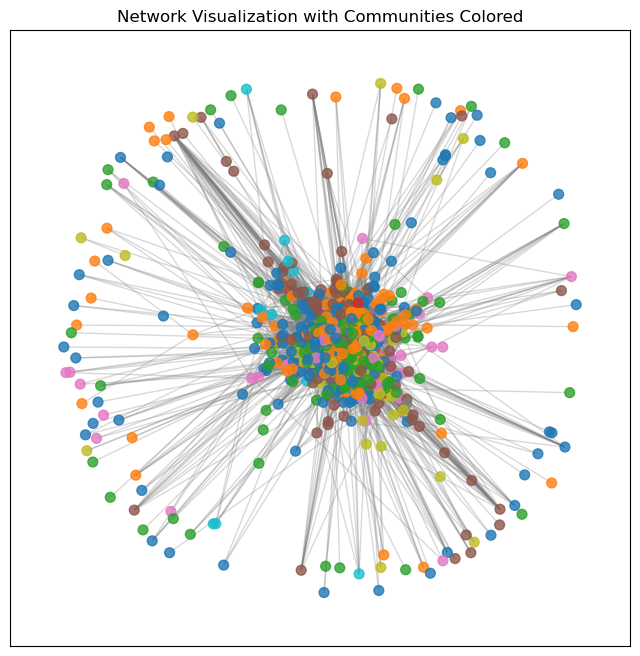

In [8]:
import networkx as nx
import community.community_louvain as community_louvai
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Assuming G is your NetworkX graph

# Step 1: Detect communities with Louvain
louvain_partition = community_louvain.best_partition(filtered_graph)

# Step 2: Identify the largest communities
# Count community sizes
from collections import Counter
community_sizes = Counter(louvain_partition.values())

# Get the top 5-10 largest communities
top_communities = {community for community, size in community_sizes.most_common(10)}

# Assign colors: largest communities get unique colors, others are gray
colors = {}
for node, community in louvain_partition.items():
    if community in top_communities:
        colors[node] = community
    else:
        colors[node] = "gray"

# Step 3: Choose a color map and map each community to a color
color_map = cm.get_cmap("tab10", len(top_communities))
node_colors = [color_map(colors[node]) if colors[node] != "gray" else "#d3d3d3" for node in filtered_graph.nodes()]

# Step 4: Apply the Fruchterman-Reingold force-directed layout
pos = nx.spring_layout(G)  # Spring layout is similar to Force Atlas

# Step 5: Plot the network
plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(filtered_graph, pos, node_color=node_colors, node_size=50, alpha=0.8)
nx.draw_networkx_edges(filtered_graph, pos, edge_color="gray", alpha=0.3)

plt.title("Network Visualization with Communities Colored")
plt.show()


<div class="alert alert-primary">
<h4>Exercises: </h4>
Communities versus genres.

* Compare the communities found by your algorithm with the music genres by creating a matrix 
 with dimension (
), where G is the 7 most common genres and C is the 7 most common communities. We set entry 
 to be the number of nodes that genre 
 has in common with community 
. The matrix 
 is what we call a confusion matrix.
* Use the confusion matrix to explain how well the communities you've detected correspond to the genres.
    * Note: This time, use all the genres associate with each node
    * Note: If a node is not characterized by any of the 7 most popular genres, just ignore it.
    * Note: If a node is not part of by any of the 7 largest communiteis, just ignore it.

</div>

In [9]:
import numpy as np
import pandas as pd
from collections import Counter

# Assuming 'genre_data' is a dictionary mapping each artist (node) to a list of genres
# Assuming 'louvain_partition' is a dictionary mapping each node to a detected community
# Assuming 'G' is the NetworkX graph containing the nodes we are analyzing

# Step 1: Identify the 7 most common genres
all_genres = [genre for genres in genre_data.values() for genre in genres]
top_genres = [genre for genre, count in Counter(all_genres).most_common(7)]
print("Top genres:", top_genres)

# Step 2: Identify the 7 largest communities
top_communities = [community for community, count in Counter(louvain_partition.values()).most_common(7)]
print("Top communities:", top_communities)

# Step 3: Initialize a confusion matrix (7x7) with zeros
confusion_matrix = np.zeros((7, 7), dtype=int)

# Step 4: Populate the confusion matrix
# Map genres and communities to indices
genre_to_index = {genre: i for i, genre in enumerate(top_genres)}
community_to_index = {community: j for j, community in enumerate(top_communities)}


# Populate the confusion matrix by iterating through each node
for node in filtered_graph.nodes():
    # Check if the node has genres and is in the top communities
    genres = genre_data.get(node, [])
    community = louvain_partition.get(node, None)
    
    if community in top_communities:
        community_index = community_to_index[community]
        # For each genre of the node that is in top genres
        for genre in genres:
            if genre in top_genres:
                genre_index = genre_to_index[genre]
                confusion_matrix[genre_index, community_index] += 1

# Convert to DataFrame for readability
confusion_df = pd.DataFrame(confusion_matrix, index=top_genres, columns=top_communities)
print("Confusion Matrix:\n", confusion_df)


Top genres: ['country', 'folk', 'country rock', 'pop', 'americana', 'bluegrass', 'rock']
Top communities: [0, 1, 2, 4, 7, 5, 8]
Confusion Matrix:
                 0    1    2    4   7   5  8
country       478  361  281  248  55  65  5
folk           21    8   98   17  23  10  1
country rock   31   49   71    7   1   4  7
pop            27   50   49   25   2   4  0
americana      16   12   92    6  18   4  8
bluegrass      36    8   28    5  49   0  1
rock           22   20   57    4   5   6  2


## Part 3: Word that characterize pages or groups of pages

<div class="alert alert-primary">
<h4>Exercises: </h4>
Comparing in the different genres.

*Setup*. You'll need to go to your archives and find the wikipedia pages of all the country artists.

Once you have the texts ready, you will want to aggregate the text into 15 long lists, one for each of the top 15 genres (let's call them 15 documents). Each document contains on all the text in that genre (so for the country genre it's a looooong big doc). In each list, you should keep all the words (or tokens to be more precise) that occur on the pages, and a count of how frequently each word occurs. So the format should be

word0 count0

word1 count1

word2 count2

...

wordN countN

This list is called a Term Frequency (or TF) list for each community. Let's build our own TF lists. Before you start counting, I am going to ask you do do a few things

Action items

* Tokenize the pages into individual strings
* Remove all punctuation from your list of tokens
* Set everything to lower case
(Optional) Lemmatize your words
* It's OK to filter out rare words (e.g. words that only appear less than 5 times).

If you are confused by the instructions for cleaning, go back and have a look Chapter 3 again.

Action item:

* Create your TF list for each of the 15 most popular genres.
* List the top 15 words for each genre.
* Comment on the top 15 words for each genre.

</div>

In [41]:
import re
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

In [42]:
# Initialize stop words and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

In [43]:
# Initialize dictionary to hold aggregated text for each genre
genre_texts = {}

# Iterate through each node in the filtered graph
for artist, data in filtered_graph.nodes(data=True):
    # Retrieve the genres for each artist
    genres = data.get('genres', [])
    # Look for the artists txt in country_artists_wiki
    with open(f'country_artists_wiki/{artist.replace(" ", "_")}.txt', 'r', encoding='utf-8') as file:
        artist_text = file.read()
        # Clean up the text, footnotes, punctuation, and convert to lowercase
        artist_text = re.sub(r'\[.*?\]', '', artist_text)
        artist_text = re.sub(r'[^\w\s]', '', artist_text)
        # Clean \n
        artist_text = artist_text.replace('\n', '')
        # Remove stop words and lemmatize the remaining words
        words = [lemmatizer.lemmatize(w.lower()) for w in artist_text.split() if w.lower() not in stop_words]
        artist_text = " ".join(words)
        # Extract plain text from paragraphs
        paragraphs = re.findall(r'==.*?==|[^=]+', artist_text)
        artist_text = " ".join([para for para in paragraphs if para and not para.startswith('=')])
        # Remove extra spaces
        artist_text = re.sub(r'\s+', ' ', artist_text)

    
    # Aggregate text for each genre
    for genre in genres:
        if genre not in genre_texts:
            genre_texts[genre] = ""
        genre_texts[genre] += " " + artist_text

# Print genre_texts
for genre, text in genre_texts.items():
    print(f"Genre: {genre}, Text length: {len(text)}")

Genre: country, Text length: 19519229
Genre: outlaw country, Text length: 733063
Genre: country rock, Text length: 3545262
Genre: ccm, Text length: 137631
Genre: gospel, Text length: 2920122
Genre: folk, Text length: 3641718
Genre: folk rock, Text length: 1382628
Genre: soft rock, Text length: 1164570
Genre: americana, Text length: 2671517
Genre: country pop, Text length: 2958013
Genre: honky-tonk, Text length: 481132
Genre: neotraditional country, Text length: 506185
Genre: texas country, Text length: 231929
Genre: western swing, Text length: 479458
Genre: christian music, Text length: 10429
Genre: alternative metal, Text length: 16
Genre: post-grunge, Text length: 40077
Genre: nu metal, Text length: 9799
Genre: alternative country, Text length: 1280776
Genre: soul, Text length: 777619
Genre: jazz, Text length: 1165393
Genre: pop, Text length: 5816408
Genre: rock, Text length: 3377732
Genre: progressive country, Text length: 753491
Genre: latin, Text length: 120361
Genre: nashville so

In [44]:
from nltk.tokenize import word_tokenize

# Tokenize the text for each genre
genre_tokens = {genre: word_tokenize(text) for genre, text in genre_texts.items()}
# Count word frequencies for each genre and filter out words appearing less than 5 times
genre_word_counts = {genre: Counter(tokens) for genre, tokens in genre_tokens.items()}
genre_word_counts = {genre: {word: count for word, count in counts.items() if count >= 5} for genre, counts in genre_word_counts.items()}

In [45]:
# Generate TF list for the top 15 genres
top_genres = [genre for genre, _ in Counter(all_genres).most_common(15)]
genre_tf = {genre: {word: count for word, count in counts.items()} for genre, counts in genre_word_counts.items() if genre in top_genres}

In [46]:
tf_list_15 = []
# Display the top 15 words for each genre
for genre, tf_list in genre_tf.items():
    # Get the top 15 most common words
    top_words = Counter(tf_list).most_common(15)
    # Save the top words for each genre in a list
    tf_list_15.append((genre, top_words))
    print(f"Top 15 words for {genre}:")
    for word, count in top_words:
        print(f"{word} {count}")
    print("\n")

Top 15 words for country:
album 23100
country 18980
song 14684
music 13945
single 12916
year 12476
scoperow 11733
released 9815
web 9505
ref 9333
rowspan2 8833
first 7862
chart 7807
styletextaligncenter 7468
also 7020


Top 15 words for country rock:
album 4775
country 3020
band 2531
song 2426
music 2418
year 2120
released 1971
single 1896
web 1754
ref 1718
first 1404
new 1347
also 1272
award 1254
scoperow 1161


Top 15 words for gospel:
album 2592
country 2573
song 2340
music 2238
web 1584
year 1432
first 1333
single 1192
ref 1156
also 1049
released 1047
one 1016
hit 949
record 921
styletextaligncenter 918


Top 15 words for folk:
album 4158
song 2881
music 2257
web 1911
ref 1827
year 1733
country 1559
released 1522
first 1491
styletextaligncenter 1410
new 1227
also 1138
magazine 1100
band 1068
refcite 1063


Top 15 words for folk rock:
album 2107
band 1239
song 1139
released 780
music 762
web 725
first 586
year 577
new 566
ref 563
record 510
also 473
refcite 430
title 428
time 427




In [47]:
print(tf_list_15)

[('country', [('album', 23100), ('country', 18980), ('song', 14684), ('music', 13945), ('single', 12916), ('year', 12476), ('scoperow', 11733), ('released', 9815), ('web', 9505), ('ref', 9333), ('rowspan2', 8833), ('first', 7862), ('chart', 7807), ('styletextaligncenter', 7468), ('also', 7020)]), ('country rock', [('album', 4775), ('country', 3020), ('band', 2531), ('song', 2426), ('music', 2418), ('year', 2120), ('released', 1971), ('single', 1896), ('web', 1754), ('ref', 1718), ('first', 1404), ('new', 1347), ('also', 1272), ('award', 1254), ('scoperow', 1161)]), ('gospel', [('album', 2592), ('country', 2573), ('song', 2340), ('music', 2238), ('web', 1584), ('year', 1432), ('first', 1333), ('single', 1192), ('ref', 1156), ('also', 1049), ('released', 1047), ('one', 1016), ('hit', 949), ('record', 921), ('styletextaligncenter', 918)]), ('folk', [('album', 4158), ('song', 2881), ('music', 2257), ('web', 1911), ('ref', 1827), ('year', 1733), ('country', 1559), ('released', 1522), ('firs

In [48]:
# Print the top 15 genres in column order
top_genres = [genre for genre, _ in Counter(all_genres).most_common(15)]
for genre in top_genres:
    print(f"{genre}")



country
folk
country rock
pop
americana
bluegrass
rock
country pop
gospel
rockabilly
blues
alternative country
folk rock
southern rock
rock and roll


## Part 4: Visualization

<div class="alert alert-primary">
<h4>Exercises: </h4>

* Get your lists ready for the word-cloud software

    * The package needs a single string to work on. The way that I converted my lists to a string was to simply combine all words together in one long string (separated by spaces), repeating each word according to its score (rounded up to the nearest integer value).
    * The wordcloud package looks for collocations in real texts, which is a problem when you make the list as above. The recommended fix is to simply set collocations = False as an option when you run the package.
* Now, create a word-cloud for each genre. Feel free to make it as fancy or non-fancy as you like. Comment on the results. (If you'd like, you can remove stopwords/wiki-syntax - I did a bit of that for my own wordclouds.)
</div>

<div>


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nerea\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


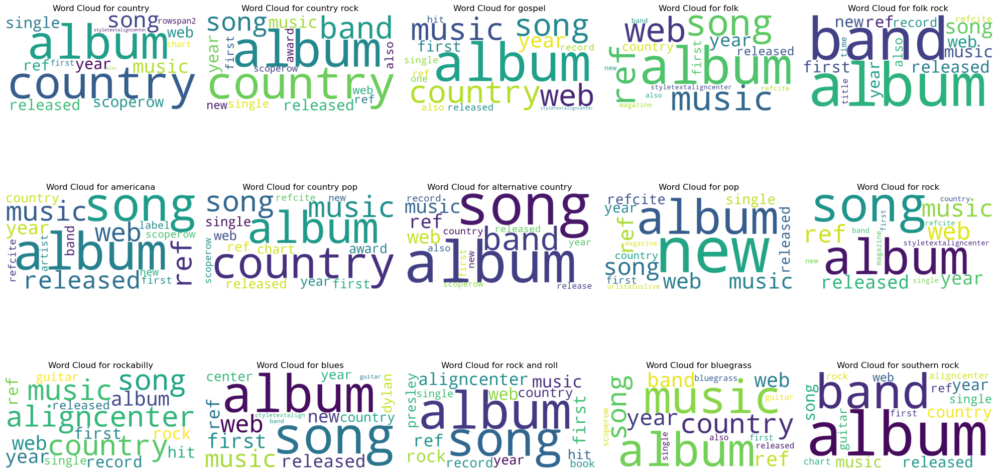

In [49]:
# Import the necessary libraries
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.corpus import stopwords

# Ensure stopwords are downloaded
import nltk
nltk.download('stopwords')

# Prepare Data
genre_texts = {}
for genre, tf_list in tf_list_15:
    text = ' '.join([word for word, freq in tf_list])
    genre_texts[genre] = text

# Generate Word Clouds
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 12))  # Adjust the number of rows and columns based on the number of genres
axes = axes.flatten()

for ax, (genre, text) in zip(axes, genre_texts.items()):
    wordcloud = WordCloud(width=800, height=400, background_color='white', 
                          stopwords=set(stopwords.words('english')), collocations=False).generate(text)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f"Word Cloud for {genre}")

plt.tight_layout()
plt.show()

In [50]:
import math

def tf_list_to_string(tf_list):
    words = []
    for word, count in tf_list:
        words.extend([word] * math.ceil(count))  # Repeat each word based on its frequency
    return ' '.join(words)

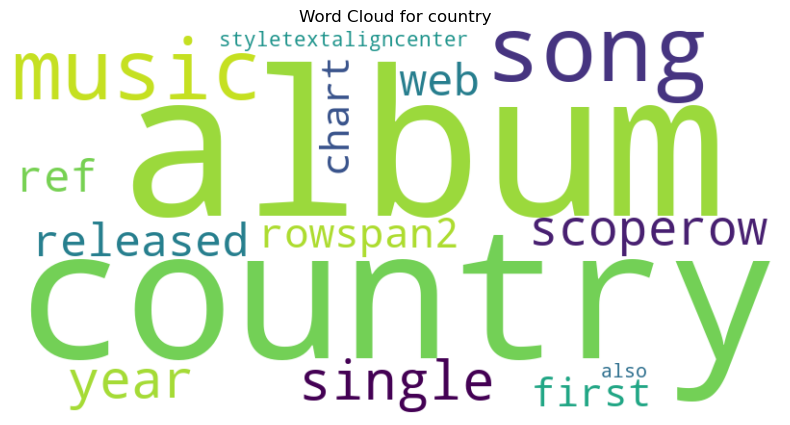

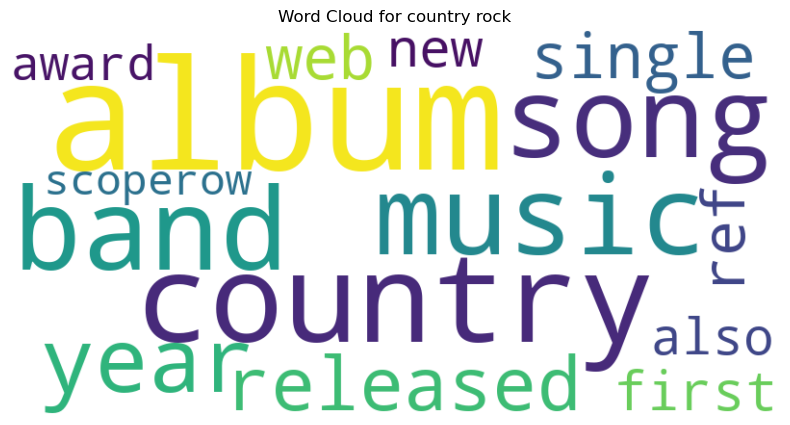

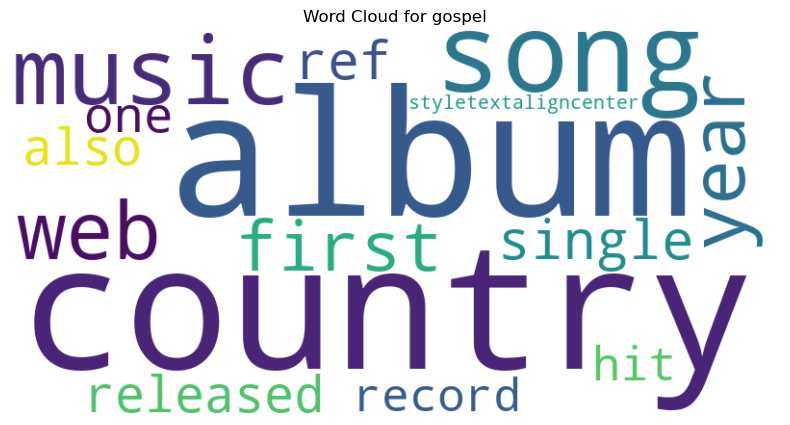

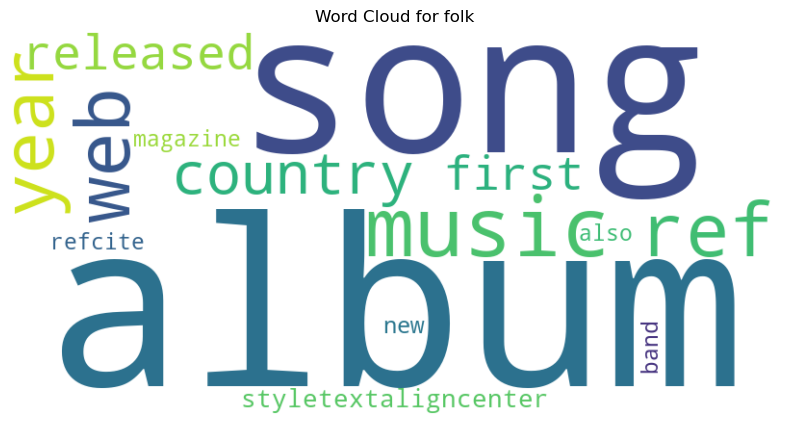

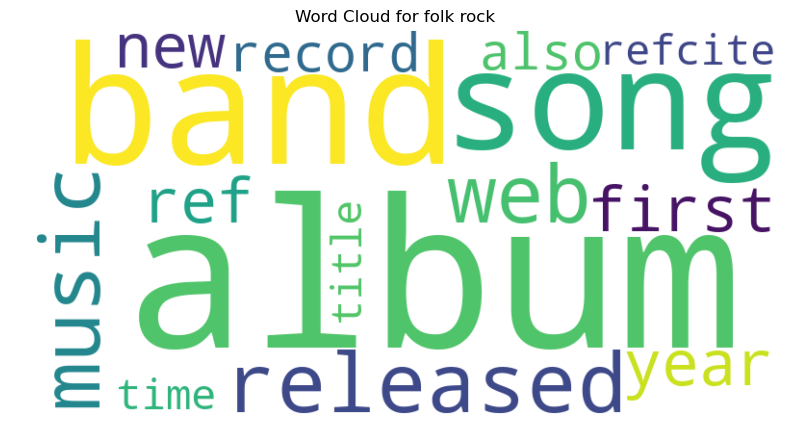

...

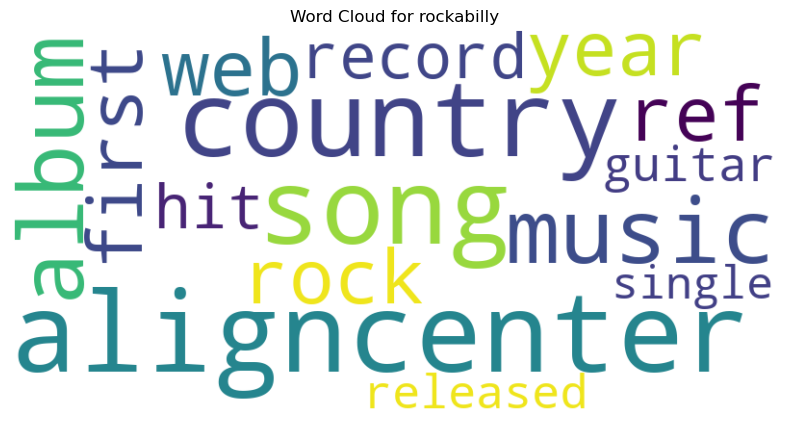

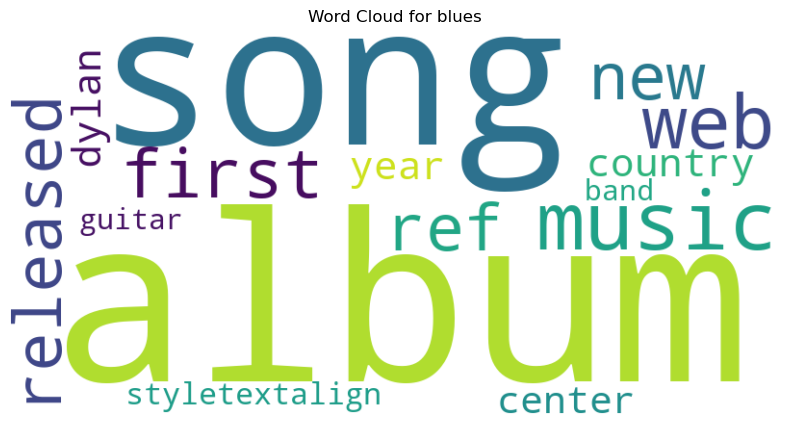

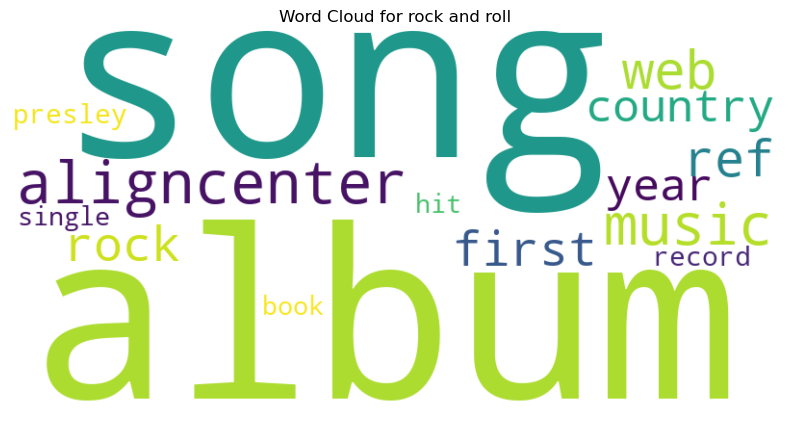

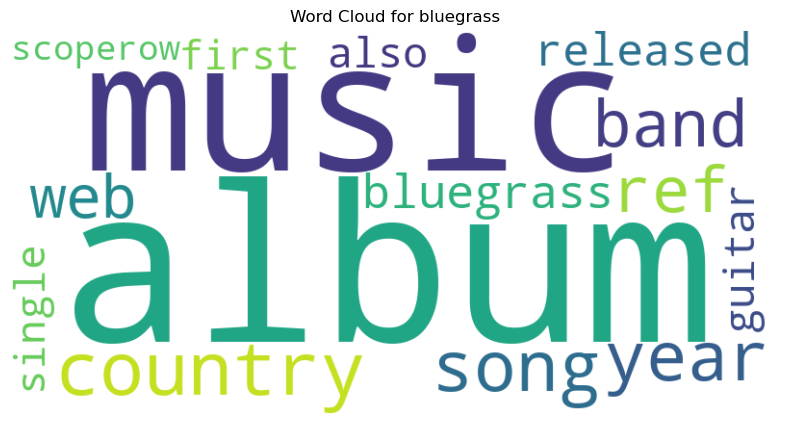

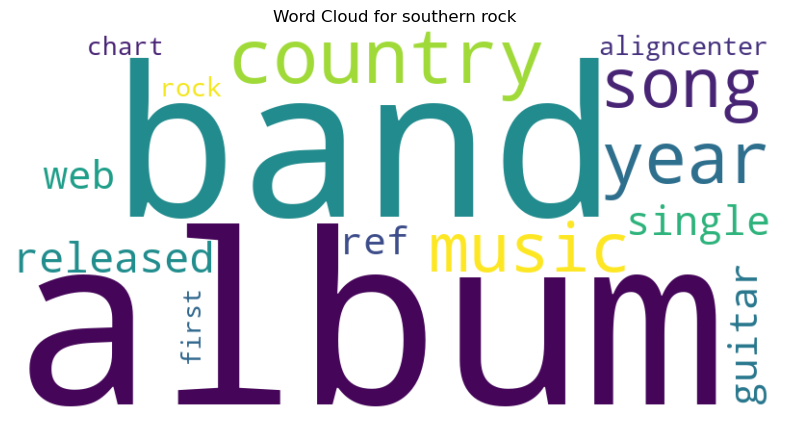

In [51]:
for genre, tf_list in tf_list_15:
    text = tf_list_to_string(tf_list)

    # Create word cloud for each genre
    wordcloud = WordCloud(width=800, height=400, background_color='white', 
                          stopwords=set(stopwords.words('english')), collocations=False).generate(text)
   
    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {genre}")
    plt.show()

## PART 5: Understanding TF-IDF

<div class="alert alert-primary">
<h4>Exercises: </h4>

Wrap your brain around TF-IDF

First, let's learn about TF-IDF the way wikipedia explains it. Check out the wikipedia page for TF-IDF and read the first part very carefully. The idea is that the term frequency doesn't capture just what's special about a text. It also captures words that are just frequent in all text.

You can fix some of this by removing stop-words (as is described in the book), but it's not enough. We want to pull out what's special about a particular text.

To focus on just what's special, TF-IDF has two components: The term frequency (TF) and a weight (IDF). The weight draws on a larger corpus of text emphasize what's special about the text we're interested in.

Further, there are some extra things going on. For example, there are multiple definitions of TF. Above, we just looked at the raw counts.

*Action items*

* Pick one of the alternative term frequency definitions. Explain why it might sometimes be prefereable to the raw count.
* What does IDF stand for? Answer in your own words.
* How does IDF draw on a larger corpus to extract what's special a certain text? Answer in your own words.

There are also multiple versions of IDF. Let's think about those for a moment.

*Action items*

* All of the IDF versions take the log of the calculated weight. Why do you think that is?
* Explain why using IDF makes stopword removal less important.

</div>

**Alternative Definition of TF**

An alternative is *log normalization*. This version calculates TF as:

TF = 1 + log(term count)

This approach is useful because it prevents very frequent terms from overly dominating the score, which can happen with raw counts. In texts, common terms like “love” in lyrics or “data” in research papers might appear frequently but aren't necessarily the most meaningful. By applying log normalization, we reduce the effect of such high-frequency words, allowing more nuanced terms to have a greater impact on the analysis.

Another alternative is term frequency divided by document length, which accounts for document length differences. This version is helpful when comparing documents of different lengths, as longer documents naturally have higher term counts. This approach can make scores more comparable across documents of varying sizes, which is useful for collections of articles, essays, or webpages with widely differing lengths.

**What does IDF stand for?**

IDF stands for Inverse Document Frequency. In simple terms, it is a measure of how rare or unique a word is across a larger set of documents (corpus). The rarer a term is, the higher its IDF score, which means the term is likely to be more unique or specific to certain documents.

**How IDF Draws on a Larger Corpus**

IDF uses a larger corpus to determine which words are common across many documents and which are rare. By looking at the frequency of a word in a large collection of documents, IDF calculates a weight that helps identify words that stand out in a particular text. For example, if the word “algorithm” appears frequently in technical documents but rarely in other types of texts, it gets a higher weight in IDF within a general context, signaling that it is more specific to technical documents.

**Wht IDF Takes the Log of the Weight**

All versions of IDF include a logarithm, typically calculated as:

IDF=log(𝑁/df)

where N is the total number of documents in the corpus, and df is the number of documents containing the term.

The logarithm is used to dampen the effect of very common words without exaggerating the impact of extremely rare words. If we didn’t use the log function, words that appear in nearly every document would have an IDF value close to zero, while very rare terms would be disproportionately high. The logarithm scales the weight so that terms in the middle frequency range can still contribute meaningfully to the overall score.

**Why IDF Makes Stopword Removal LEss Important?**

Since stopwords (like "the," "is," "of") are highly common across nearly all documents, their IDF scores are naturally low. As a result, the TF-IDF score for these stopwords tends to be minimized without explicitly removing them. Because IDF reduces the impact of widely common words, stopword removal is less critical—although it can still be useful to improve computation efficiency and focus on more meaningful terms.

## PART 6: Genres and TF-IDF word-clouds

<div class="alert alert-primary">
<h4>Exercises: </h4>
Now we have all of the ingredients for a wonderful cocktail 😎

* We have genres - descriptions of related nodes in the network.
* And you're an expert on TF-IDF, so you can extract words that characterize a text relative to everything that's going on.
* Finally, you can create nice WordCouds!

So let's put it all together. Let's use TF-IDF and wordcoulds to build a deeper understanding of the top communities.

Thus, the aim of this final part is to create genre wordclouds for the top 15 genres based on TF-IDF.

For each genre, create a single document for each community consisting of all the cleaned text from all members of the community. So in the end, you should have 15 documents in total.

</div>

<div class="alert alert-primary">
<h4>Exercises: </h4>
Genre Word-clouds

* Now that we have the community-texts, let's start by grabbing the TF lists from the exercise above (you may modify to use whichever version of TF you like).
* Next, calculate IDF for every word in every list (use whichever version of IDF you like).
    * Which base logarithm did you use? Is that important?
* We're now ready to calculate TF-IDFs. Do that for each genre.
    * List the 10 top words for each genre accourding to TF-IDF. Are these 10 words more descriptive of the genre than just the TF? Justify your answer.
* Create a wordcloud for each genre.
* Explain your creation. Do the wordclouds/TF-IDF lists enable you to understand the communities you have found (or is it just gibberish)? Justify your answer.


</div>

In [53]:
# log-normalize Tf for all the genres
import math
from collections import Counter

tf_scores = {}
for genre, word_list in genre_tf.items():
    tf_scores[genre] = {}  # Initialize an empty dictionary for each genre
    print(f"Genre: {genre}")
    for word, count in word_list.items():
        tf_scores[genre][word] = 1 + math.log(count)
        


Genre: country
Genre: country rock
Genre: gospel
Genre: folk
Genre: folk rock
Genre: americana
Genre: country pop
Genre: alternative country
Genre: pop
Genre: rock
Genre: rockabilly
Genre: blues
Genre: rock and roll
Genre: bluegrass
Genre: southern rock


In [57]:
# calculate the inverse document frequency (IDF) for each word

N = len(genre_tf)  # Total number of genres
print(f"Total number of genres: {N}")

df_counts = Counter()  # Initialize a Counter to store document frequencies

# Calculate document frequency for each word
for genre, word_list in genre_tf.items():
    df_counts.update(word_list.keys())

# Calculate IDF for each word
idf_scores = {}
for word, df in df_counts.items():
    idf_scores[word] = math.log(N / df)

print(f"IDF scores for the top 15 genres: {idf_scores}")

Total number of genres: 15
IDF scores for the top 15 genres: {'short': 0.0, 'descriptionamerican': 0.0, 'singer': 0.0, 'songwriterinfobox': 2.70805020110221, 'musical': 0.0, 'artist': 0.0, 'name': 0.0, 'tanya': 0.7621400520468967, 'tucker': 0.4054651081081644, 'image': 0.0, 'caption': 0.0, 'performing': 0.0, '2020': 0.0, 'birth_name': 0.0, 'denise': 1.6094379124341003, 'birth_date': 0.0, 'birth': 0.0, 'date': 0.0, 'celebrates': 0.22314355131420976, 'birthday': 0.0, 'downtown': 0.14310084364067324, 'may': 0.0, 'january': 0.0, '2018ref': 0.0, 'birth_place': 0.0, 'u': 0.0, 'instrument': 0.0, 'hlistvocals': 2.70805020110221, 'genre': 0.0, 'hlist': 0.0, 'background': 0.0, 'solo_singer': 0.0, 'occupation': 0.0, 'hlistsingersongwriter': 0.9162907318741551, 'years_active': 0.0, '1971present': 2.70805020110221, 'label': 0.0, 'road': 0.0, 'website': 0.0, 'born': 0.0, 'october': 0.0, '10': 0.0, '1958ref': 1.3217558399823195, 'namelarkincountrycite': 1.0986122886681098, 'american': 0.0, 'country':

In [58]:
# Calculate TF-IDF scores for each word in each genre
tfidf_scores = {}
for genre, word_list in genre_tf.items():
    tfidf_scores[genre] = {word: tf_scores[genre][word] * idf_scores[word] for word in word_list}

# Print the TF-IDF scores for the top 15 genres
for genre, scores in tfidf_scores.items():
    print(f"TF-IDF scores for {genre}:")
    for word, score in scores.items():
        print(f"{word}: {score}")
    print("\n")


TF-IDF scores for country:
short: 0.0
descriptionamerican: 0.0
singer: 0.0
songwriterinfobox: 8.943566225239687
musical: 0.0
artist: 0.0
name: 0.0
tanya: 3.8826040297967768
tucker: 2.522137247086633
image: 0.0
caption: 0.0
performing: 0.0
2020: 0.0
birth_name: 0.0
denise: 5.856836831803993
birth_date: 0.0
birth: 0.0
date: 0.0
celebrates: 1.311012395370844
birthday: 0.0
downtown: 0.6970729742042195
may: 0.0
january: 0.0
2018ref: 0.0
birth_place: 0.0
u: 0.0
instrument: 0.0
hlistvocals: 9.201670976825877
genre: 0.0
hlist: 0.0
background: 0.0
solo_singer: 0.0
occupation: 0.0
hlistsingersongwriter: 4.604683178628733
years_active: 0.0
1971present: 8.658244659624279
label: 0.0
road: 0.0
website: 0.0
born: 0.0
october: 0.0
10: 0.0
1958ref: 5.345871152000461
namelarkincountrycite: 6.004913827884715
american: 0.0
country: 0.0
music: 0.0
songwriter: 0.0
first: 0.0
hit: 0.0
1972: 0.0
age: 0.0
13: 0.0
career: 0.0
became: 0.0
one: 0.0
child: 0.0
performer: 0.0
mature: 2.264994279501546
adulthood: 6.

In [60]:
# identify top 10 words based on TF-IDF scores

top_words_tfidf = {}
for genre, scores in tfidf_scores.items():
    # Sort words by TF-IDF score and get the top 10
    top_words = sorted(scores.items(), key=lambda x: x[1], reverse=True)[:10]
    top_words_tfidf[genre] = top_words
    print(f"Top words for {genre}: {top_words}")


Top words for country: [('tillis', 16.945611600615983), ('wrestling', 16.8156002249436), ('autry', 15.910329292610044), ('peck', 15.910329292610044), ('guyton', 15.151865435347943), ('oslin', 15.124372303763147), ('diffie', 15.068534238907192), ('titleblake', 14.893760683761753), ('nolan', 14.893760683761753), ('mickie', 14.64166714485715)]
Top words for country rock: [('aerosmith', 11.59292625502256), ('kracker', 11.531139186101697), ('lynae', 11.424927525959584), ('bice', 11.273623886332167), ('rachele', 11.078748338534666), ('beathard', 10.966414456460491), ('aerosmiths', 10.952769800839315), ('ledoux', 10.63197050159848), ('worsnop', 10.60378958039754), ('kamp', 10.38053416723911)]
Top words for gospel: [('laine', 12.290639290327332), ('locklin', 10.818916696579977), ('traviss', 10.264610246104372), ('pta', 10.041586092791931), ('titlereba', 9.976275924010633), ('mandrell', 9.846531189740766), ('mcentires', 9.639678144228897), ('titlerandy', 9.060026667489943), ('laines', 8.9340542

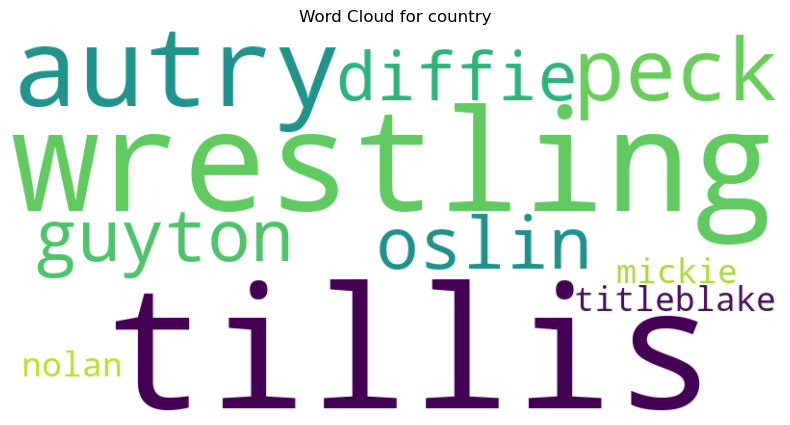

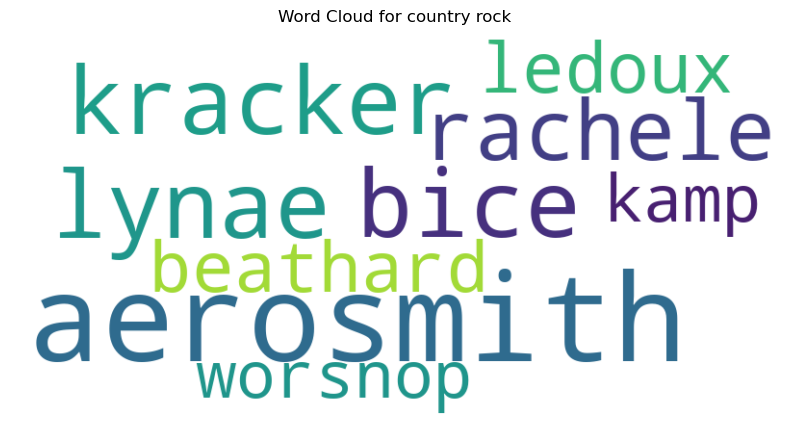

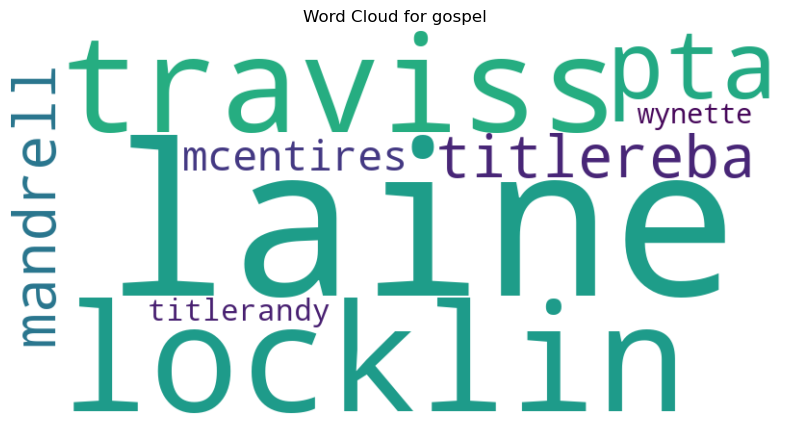

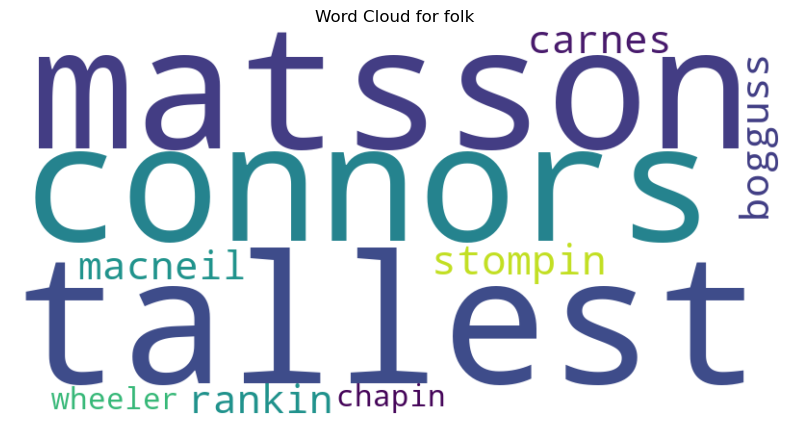

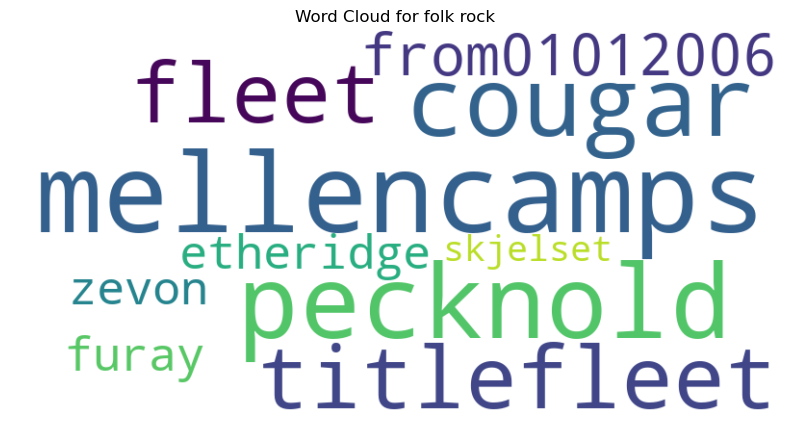

...

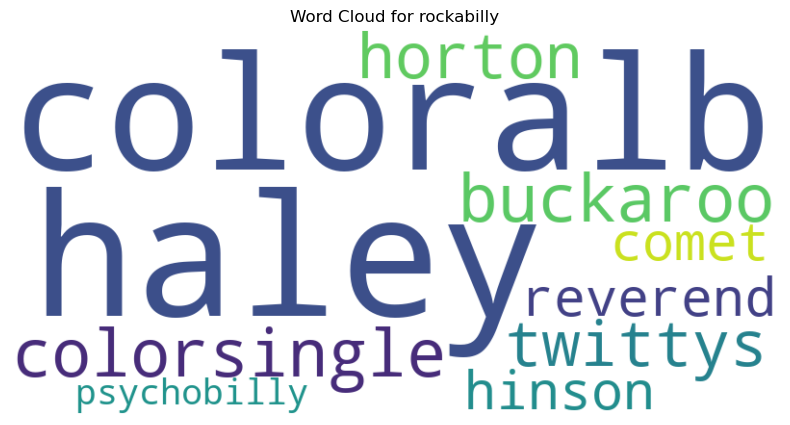

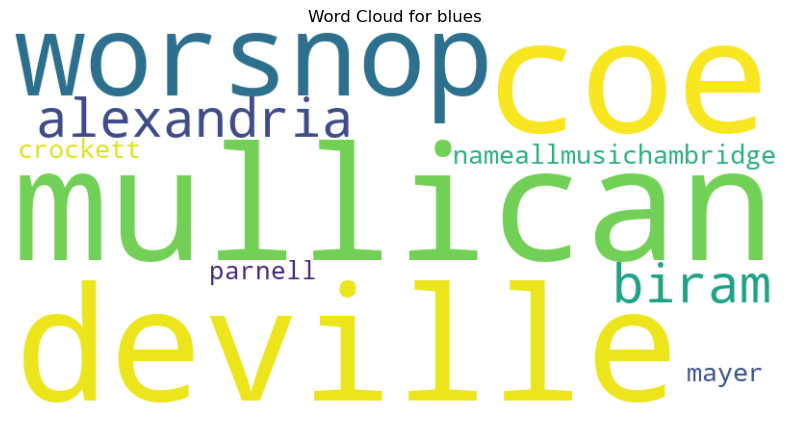

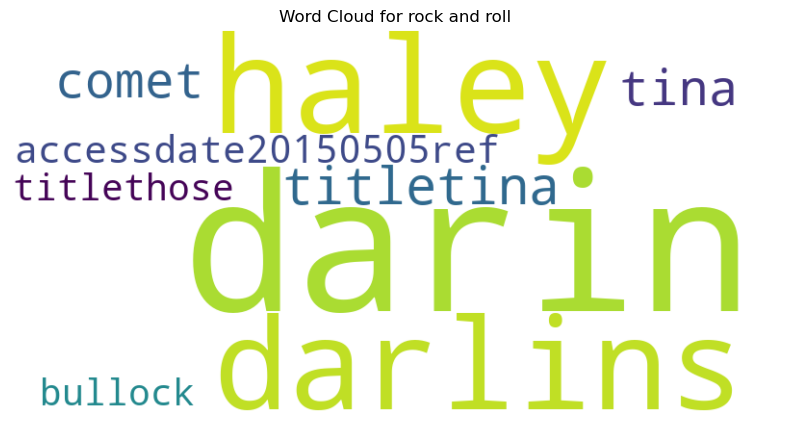

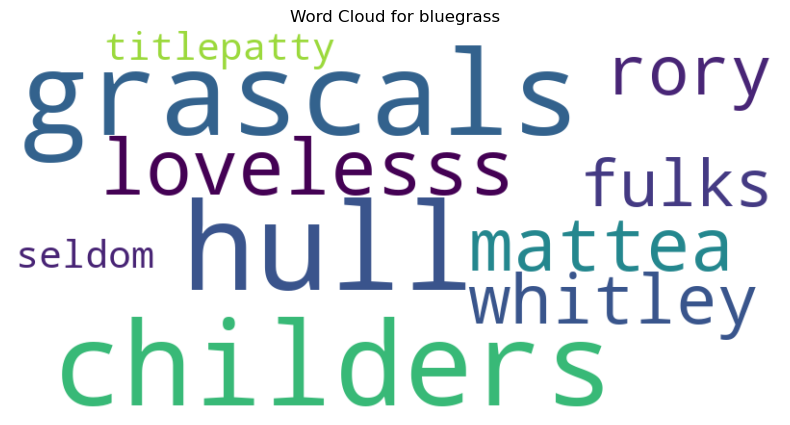

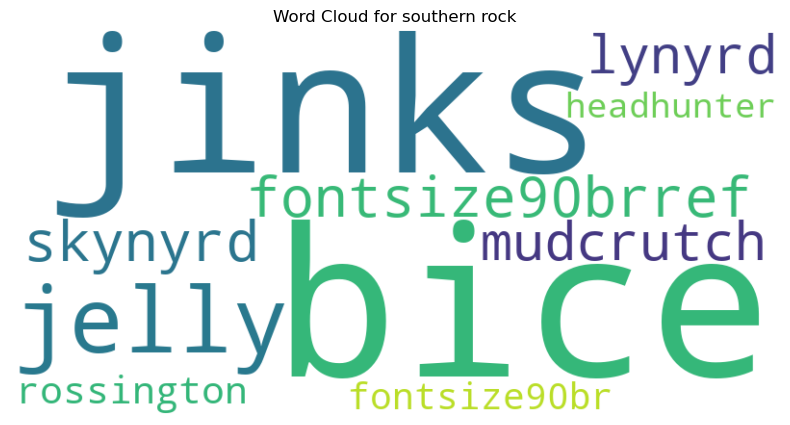

In [61]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word clouds
for genre, top_words in top_words_tfidf.items():
    # Prepare a single string with each word repeated according to its TF-IDF score
    wordcloud_input = ' '.join([word for word, score in top_words for _ in range(int(score))])
    
    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(wordcloud_input)
    
    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {genre}")
    plt.show()


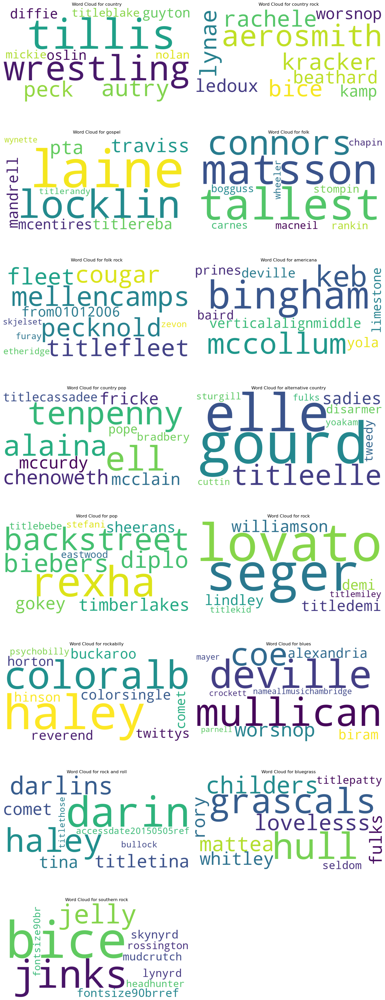

In [62]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Number of genres
num_genres = len(top_words_tfidf)

# Determine the number of rows and columns for the subplots
cols = 2
rows = (num_genres + 1) // cols

# Create a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten the axs array for easy iteration
axs = axs.flatten()

# Generate word clouds
for i, (genre, top_words) in enumerate(top_words_tfidf.items()):
    # Prepare a single string with each word repeated according to its TF-IDF score
    wordcloud_input = ' '.join([word for word, score in top_words for _ in range(int(score))])
    
    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(wordcloud_input)
    
    # Display the word cloud
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')
    axs[i].set_title(f"Word Cloud for {genre}")

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()